# 16-election Reddit Analysis (2)

python=3.7

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import re
import json
from joblib import dump, load
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# display all columns 
pd.set_option('display.max_columns', None)
# display the complete content
pd.set_option('display.max_colwidth', None)

## 社区分类

In [2]:
import sys
sys.version_info

sys.version_info(major=3, minor=7, micro=16, releaselevel='final', serial=0)

In [ ]:
# all the debunking communities are about debunking
def get_communities(node_file:str, topn_labels:list)->list:
    '''将指定编号的社区提取出来'''
    # 导入节点列表
    vex = pd.read_csv("/mnt/data/wenlu/reddit-new/nodes-RC-16election(moduralarity=3).csv")
    # 社区列表
    com_ls = []
    for s in topn_labels:
        com_ls.append(vex[vex['modularity_class'] == s])
    # 每个社区中的结点按入度降序排序
    for com in com_ls:
        com.sort_values(by='indegree', ascending=False, inplace=True)
        com.reset_index(inplace=True)
    # 返回包含前n个社区的列表
    return com_ls

top8_list = [(5,0.1272),(168,0.0595),(173,0.0558),(5834,0.0445),(1628,0.0217),(559,0.0183),(4820,0.0159),(6041,0.0158)]
communities_topn = get_communities(\
    "nodes-RC-16election(moduralarity=3).csv", \
    [top8_list[i][0] for i in range(len(top8_list))])

In [70]:

db_list = [0,1,2,3, 4, 5, 6, 7]          # debunking

def communitiy_classifying(communities, label_list, commnity_number_lists):
    #将社区分类。
    assert len(label_list) == len(commnity_number_lists)
    com_3type = {}
    for i in range(len(label_list)):
        com_3type[label_list[i]] = pd.concat([communities[no] for no in commnity_number_lists[i]], axis=0)
    # 按入度降序排序
    for t in com_3type.values():
        t.sort_values(['indegree'], ascending=False, inplace=True)
        t.reset_index(drop=True, inplace=True)
        t.drop(['index'], axis=1, inplace=True)
    return com_3type


In [23]:
communities_topn

[      index                      Id                   Label  modularity_class  \
 0        15             u/[deleted]             u/[deleted]                 5   
 1       748               u/bane187               u/bane187                 5   
 2      1136           u/LittleShrub           u/LittleShrub                 5   
 3      3675            u/coralsnake            u/coralsnake                 5   
 4      4258       u/WatchingDonFail       u/WatchingDonFail                 5   
 ...     ...                     ...                     ...               ...   
 3494  17550        u/miss_marty_mew        u/miss_marty_mew                 5   
 3495   6312  u/trumpforpresident016  u/trumpforpresident016                 5   
 3496  17515          u/Sportfreunde          u/Sportfreunde                 5   
 3497  17503    u/OPisAbundleOfTwigs    u/OPisAbundleOfTwigs                 5   
 3498     14       u/Laurasaurus1009       u/Laurasaurus1009                 5   
 
       indegre

### 查看每个社区前十用户

In [24]:
communities_topn[0].iloc[0:10]

,index,Id,Label,modularity_class,indegree,outdegree,degree
0,15,u/[deleted],u/[deleted],5,269,1944,2213
1,748,u/bane187,u/bane187,5,46,2,48
2,1136,u/LittleShrub,u/LittleShrub,5,20,0,20
3,3675,u/coralsnake,u/coralsnake,5,18,0,18
4,4258,u/WatchingDonFail,u/WatchingDonFail,5,16,0,16
5,2431,u/Bernanos,u/Bernanos,5,16,0,16
6,4928,u/zroxx2,u/zroxx2,5,15,0,15
7,6638,u/cd411,u/cd411,5,13,0,13
8,3449,u/system_exposure,u/system_exposure,5,13,2,15
9,2692,u/ilikelegoandcrackers,u/ilikelegoandcrackers,5,13,2,15


In [25]:
communities_topn[1].iloc[0:10]

,index,Id,Label,modularity_class,indegree,outdegree,degree
0,181,u/autotldr,u/autotldr,168,216,1,217
1,721,u/Panprometheus,u/Panprometheus,168,35,1,36
2,1377,u/NathanOhio,u/NathanOhio,168,14,6,20
3,926,u/KSDem,u/KSDem,168,13,3,16
4,770,u/sematrix,u/sematrix,168,12,11,23
5,12138,u/NutritionResearch,u/NutritionResearch,168,12,1,13
6,19412,u/NaughtyHealer,u/NaughtyHealer,168,11,0,11
7,383,u/gideonvwainwright,u/gideonvwainwright,168,10,4,14
8,2368,u/EvilPhd666,u/EvilPhd666,168,9,1,10
9,313,u/ShotBot,u/ShotBot,168,8,50,58


In [26]:
communities_topn[2].iloc[0:10]

,index,Id,Label,modularity_class,indegree,outdegree,degree
0,42,u/SnapshillBot,u/SnapshillBot,173,133,1,134
1,2462,u/PoliticsModeratorBot,u/PoliticsModeratorBot,173,42,4,46
2,14381,u/Odawn,u/Odawn,173,29,4,33
3,23,u/OneYearSteakDay,u/OneYearSteakDay,173,24,3,27
4,152,u/blackfellasbot,u/blackfellasbot,173,15,0,15
5,147,u/HollowUkuleleChords,u/HollowUkuleleChords,173,15,10,25
6,4466,u/krabbby,u/krabbby,173,12,0,12
7,6000,u/GeneticsGuy,u/GeneticsGuy,173,11,0,11
8,196,u/MiyegomboBayartsogt,u/MiyegomboBayartsogt,173,9,0,9
9,9942,u/lurker093287h,u/lurker093287h,173,8,0,8


## LIWC sentiment analysis

In [3]:
# read the LIWC dic.
import liwc
liwcPath = r'/mnt/data/wenlu/LIWC2015_English.dic'
parse, category_names = liwc.load_token_parser(liwcPath)

### 'Body' text cleanning

In [3]:
# read the data
df = load("16-pkl/16election_debunk_[lang=en][time=16.10-16.12].pkl")
rcomments_db = df[df['author'].notnull()]

In [4]:
rcomments_db.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30297 entries, 6793 to 78746321
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    30297 non-null  object 
 1   subreddit_id  30297 non-null  object 
 2   created_utc   30297 non-null  float64
 3   subreddit     30297 non-null  object 
 4   author        30297 non-null  object 
 5   id            30297 non-null  object 
 6   parent_id     30297 non-null  object 
 7   body          30297 non-null  object 
 8   lang          30297 non-null  object 
dtypes: float64(1), object(8)
memory usage: 2.3+ MB


In [10]:
# remove punctuation marks, URLs, line breaks and other characters
import string

def wordopt(body):
    text = body.lower()
    text = re.sub(r'\\n', '', text)#此处加上这句代码
    text = re.sub('\[.*?\]', '', text) # 去掉中括号括起来的字符串
    text = re.sub('https?://\S+|www\.\S+', '', text) # 去掉网址
    text = re.sub("\\W"," ",text) # 去掉非单词字符
    text = re.sub('<.*?>+', '', text) # 去掉HTML, XML标签
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text) # 将文本中所有标点符号删除
    text = re.sub('\n', '', text) # 删除换行符
    text = re.sub('\w*\d\w*', '', text) # 删除字母数字混合的“单词”
    return text

rcomments_db['body'] = rcomments_db.body.apply(lambda x : wordopt(x))
rcomments_db['body']

6793                                                                                                                                                                                                                                                                                                                                                                                                                                         gt  the warrant i linked to is for clinton s emails  a warrant for weiner s computer had already been issued and the new emails are covered under the new warrant  and thus should be admissible   they obtained that warrant only yesterday  they went snooping through huma s account weeks ago searching for emails from clinton s server  while ostensibly searching  weiner s  accounts for child pornography  whatever warrant they obtained to search weiner s accounts for child pornography would  not  have covered searching huma s accounts for clinton emails   a number of le

In [11]:
# remove stop words

import nltk
#nltk.download('stopwords')
#nltk.download('punkt')
eng_stopwords = nltk.corpus.stopwords.words("english")

def remove_eng_stopwords(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [word for word in token_text if word not in eng_stopwords]
    join_text = ' '.join(remove_stop)
    return join_text

rcomments_db['body'] = rcomments_db.body.apply(lambda x : remove_eng_stopwords(x))
rcomments_db['body']

6793                                                                                                                                                                                     gt warrant linked clinton emails warrant weiner computer already issued new emails covered new warrant thus admissible obtained warrant yesterday went snooping huma account weeks ago searching emails clinton server ostensibly searching weiner accounts child pornography whatever warrant obtained search weiner accounts child pornography would covered searching huma accounts clinton emails number legal experts analyzed agree search seizure unconstitutional gt impression emails weiner computer folder titled life insurance account elsewhere would share source according alt right conspiracy theorists
8369                                                                                                                                                                                                                 

In [12]:
# lemmatization

#nltk.download('wordnet')
#nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()

def word_lemmatizer(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [lemm.lemmatize(w) for w in token_text]
    join_text = ' '.join(remove_stop)
    return join_text

rcomments_db['body'] = rcomments_db.body.apply(lambda x : word_lemmatizer(x))
rcomments_db['body']

6793                                                                                                                                                                          gt warrant linked clinton email warrant weiner computer already issued new email covered new warrant thus admissible obtained warrant yesterday went snooping huma account week ago searching email clinton server ostensibly searching weiner account child pornography whatever warrant obtained search weiner account child pornography would covered searching huma account clinton email number legal expert analyzed agree search seizure unconstitutional gt impression email weiner computer folder titled life insurance account elsewhere would share source according alt right conspiracy theorist
8369                                                                                                                                                                                                                                       

In [13]:
# 去除噪声
from nltk.corpus import stopwords
Word_STOPWORDS = ["e", "te", "i", "me", "qe", "ne", "nje", "a", "per", "sh", "nga", "ka", "u", "eshte", "dhe", "shih", "nuk",
             "m", "dicka", "ose", "si", "shume", "etj", "se", "pa", "sipas", "s", "t", "dikujt", "dike", "mire", "vet",
             "bej", "ai", "vend", "prej", "ja", "duke", "tjeter", "kur", "ia", "ku", "ta", "keq", "dy", "ben", "bere",
             "behet", "dickaje", "edhe", "madhe", "la", "sa", "gjate", "zakonisht", "pas", "veta", "mbi", "disa", "iu",
             "mos", "c", "para", "dikush", "gje", "be", "pak", "tek", "fare", "beri", "po", "bie", "k", "do", "gjithe",
             "vete", "mund", "kam", "le", "jo", "beje", "tij", "kane", "ishte", "jane", "vjen", "ate", "kete", "neper",
             "cdo", "na", "marre", "merr", "mori", "rri", "deri", "b", "kishte", "mban", "perpara", "tyre", "marr",
             "gjitha", "as", "vetem", "nen", "here", "tjera", "tjeret", "drejt", "qenet", "ndonje", "nese", "jap",
             "merret", "rreth", "lloj", "dot", "saj", "nder", "ndersa", "cila", "veten", "ma", "ndaj", "mes", "ajo",
             "cilen", "por", "ndermjet", "prapa", "mi", "tere", "jam", "ashtu", "kesaj", "tille", "behem", "cilat",
             "kjo", "menjehere", "ca", "je", "aq", "aty", "prane", "ato", "pasur", "qene", "cilin", "teper", "njera",
             "tej", "krejt", "kush", "bejne", "ti", "bene", "midis", "cili", "ende", "keto", "kemi", "sic", "kryer",
             "cilit", "atij", "gjithnje", "andej", "siper", "sikur", "ketej", "ciles", "ky", "papritur", "ua",
             "kryesisht", "gjithcka", "pasi", "kryhet", "mjaft", "ketij", "perbashket", "ata", "atje", "vazhdimisht",
             "kurre", "tone", "keshtu", "une", "sapo", "rralle", "vetes", "ishin", "afert", "tjetren", "ketu", "cfare",
             "to", "anes", "jemi", "asaj", "secila", "kundrejt", "ketyre", "pse", "tilla", "mua", "nepermjet", "cilet",
             "ndryshe", "kishin", "ju", "tani", "atyre", "dic", "yne", "kudo", "sone", "sepse", "cilave", "kem", "ty",
             "t'i", "nbsp", "tha", "re", "the", "jr", "t", "n"]
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation)
stop.update(punctuation)
text_unknows= Word_STOPWORDS
stop.update(text_unknows)

# 去除噪声字符或字符串

from bs4 import BeautifulSoup
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")
    return soup.get_text()

def remove_between_square_brackets(text):
    '''Removing the square brackets'''
    return re.sub('\[[^]]*\]', '', text)

def remove_between_square_brackets(text):
    '''Removing URL's'''
    return re.sub(r'http\S+', '', text)

def remove_stopwords(text):
    '''Removing the stopwords from text'''
    final_text = []
    for i in text.split():
        if i.strip().lower() not in stop:
            final_text.append(i.strip())
    return " ".join(final_text)

def denoise_text(text):
    '''Removing the noisy text'''
    text = strip_html(text)
    text = remove_between_square_brackets(text)
    text = remove_stopwords(text)
    return text

rcomments_db['body'] = rcomments_db.body.apply(lambda x : denoise_text(x))
rcomments_db['body']

6793                                                                                                                                                                       gt warrant linked clinton email warrant weiner computer already issued new email covered new warrant thus admissible obtained warrant yesterday went snooping huma account week ago searching email clinton server ostensibly searching weiner account child pornography whatever warrant obtained search weiner account child pornography would covered searching huma account clinton email number legal expert analyzed agree search seizure unconstitutional gt impression email weiner computer folder titled life insurance account elsewhere would share source according alt right conspiracy theorist
8369                                                                                                                                                                                                                                          

In [14]:
# 去除标点符号
def punctuation_removal(text):
    all_list = [char for char in text if char not in string.punctuation]
    clean_str = ''.join(all_list)
    return clean_str

rcomments_db['body'] = rcomments_db['body'].apply(punctuation_removal)
rcomments_db['body']

6793                                                                                                                                                                       gt warrant linked clinton email warrant weiner computer already issued new email covered new warrant thus admissible obtained warrant yesterday went snooping huma account week ago searching email clinton server ostensibly searching weiner account child pornography whatever warrant obtained search weiner account child pornography would covered searching huma account clinton email number legal expert analyzed agree search seizure unconstitutional gt impression email weiner computer folder titled life insurance account elsewhere would share source according alt right conspiracy theorist
8369                                                                                                                                                                                                                                          

In [15]:
# .agg the users' texts
user_texts = rcomments_db.groupby(by='author').agg(body=("body", lambda x: " ".join(set(x))))
user_texts.reset_index(drop=False, inplace=True)
user_texts.to_csv("reddituser_texts_of_16election[time=16.10_to_16.12][lang=en].csv", index=False)

In [23]:
# user_texts = pd.read_csv("/mnt/data/wenlu/user_3media_retweet_texts_of_RU[time=22.02.20_to_22.10.30][lang=en].csv")

### LIWC for analysis

In [16]:
# analyse each user with LIWC
from sklearn.feature_extraction.text import TfidfVectorizer

def liwc_analyse(user_twts):
    
    global parse
    corpus = []
    words = []

    review = re.sub('[^a-zA-Z0-9]', ' ', user_twts['body'])
    review = review.split()
    review = list(category for token in review for category in parse(token))
    statements = ' '.join(review)
    corpus.append(statements)
    words.append(review)
    
    # TF-IDF
    try:
        vectorizer = TfidfVectorizer(max_features=5000)
        X_fit = vectorizer.fit(corpus)
        X_transformed = X_fit.transform(corpus)

        features = vectorizer.get_feature_names()
        df_count = pd.DataFrame(X_transformed.toarray(),columns = features)
    except:
        df_count = pd.DataFrame()

    user_twts = pd.DataFrame(user_twts).T
    user_twts.reset_index(drop=True, inplace=True)
    
    return pd.concat([user_twts, df_count], axis=1) # 代价比较高 It may cost a lot

user_rt_sentiments = user_texts.apply(liwc_analyse, axis=1).tolist()

In [17]:
user_rt_sentiments[9]

,author,body,achieve,achievement,adj,adjectives,adverb,adverbs,affect,affiliation,anger,assent,auxiliary,auxverb,causal,cause,certain,certainty,cognitive,cogproc,compare,comparisons,conj,conjunctions,differ,differentiation,discrep,discrepancies,drives,emotions,focus,focuspast,focuspresent,function,impersonal,informal,insight,ipron,language,leisure,money,motion,negative,negemo,number,numbers,past,percept,perceptual,posemo,positive,power,prep,prepositions,present,processes,pronoun,pronouns,quant,quantifiers,relativ,relativity,reward,risk,sad,see,social,space,tentat,tentative,time,verb,verbs,words,work
0,u/-Fender-,trump university exactly stated purpose information publicly available judge sitting trial confirmed member raza anything claimed trial made lens large bias old history irs investigated trump dozen time rare opponent send charged anything obvious followed law worked minimize tax yes like legal way valid criticism fine try spread misinformation edit fixed typo even bernie actually attempted make sense instead simply pandering primary would probably obtained lot support even people traditionally vote republican instead tried play game guaranteed lose someone like clinton already bought medium favour two decade socialism always bound fail government involvement need minimal unless want stem progress remove incentive improving quality good service president leaning towards communism something want president show rational objective rather ideologically driven support people disagree economic agenda give,0.105637,0.105637,0.02881,0.02881,0.086431,0.086431,0.230482,0.076827,0.019207,0.019207,0.009603,0.009603,0.038414,0.038414,0.038414,0.038414,0.249689,0.249689,0.019207,0.019207,0.009603,0.009603,0.048017,0.048017,0.048017,0.048017,0.42255,0.115241,0.163258,0.067224,0.096034,0.345723,0.038414,0.019207,0.05762,0.038414,0.009603,0.038414,0.096034,0.076827,0.038414,0.038414,0.019207,0.019207,0.067224,0.019207,0.019207,0.076827,0.076827,0.134448,0.038414,0.038414,0.096034,0.268895,0.038414,0.076827,0.009603,0.009603,0.134448,0.134448,0.038414,0.038414,0.038414,0.019207,0.172861,0.076827,0.067224,0.067224,0.115241,0.172861,0.182465,0.172861,0.249689


In [18]:
dump(user_rt_sentiments, "/mnt/data/wenlu/reddit-new/16-pkl/user_rt_sentiments[topic=rc-16election][lang=En].pkl")

['/mnt/data/wenlu/reddit-new/16-pkl/user_rt_sentiments[topic=rc-16election][lang=En].pkl']

### Visualizing sentiment data

In [16]:
# 转推三种媒体的用户
#user_rt_sentiments = load("/mnt/data/wenlu/reddit-new/16-pkl/user_rt_sentiments[topic=rc-16election].pkl")
# 把liwc分析结果变成字典，键值为username，方便操作
user_rt_sentiments_dict = {a['author'][0]:dict(pd.Series(a.T[0])) for a in user_rt_sentiments}
len(user_rt_sentiments)

18385

In [17]:
# 保存字典形式的liwc分析结果
dump(user_rt_sentiments_dict, "/mnt/data/wenlu/reddit-new/16-pkl/new_user_rt_sentiments_dict[topic=rc-16election][lang-en].pkl")

['/mnt/data/wenlu/reddit-new/16-pkl/new_user_rt_sentiments_dict[topic=rc-16election][lang-en].pkl']

In [15]:
#user_rt_sentiments = load("/mnt/data/wenlu/reddit-new/16-pkl/user_rt_sentiments[topic=rc-16election][lang=En].pkl")
#user_rt_sentiments_dict = load("/mnt/data/wenlu/reddit-new/16-pkl/new_user_rt_sentiments[topic=rc-16election][lang=En].pkl")

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/wenlu/reddit-new/16-pkl/new_user_rt_sentiments[topic=rc-16election][lang=En].pkl'

In [18]:
def get_user_liwc_score(u, category:str):
    global user_rt_sentiments_dict
    try:
        tmp = user_rt_sentiments_dict[u][category]
        return tmp
    except:
        return None

'''
# 给每个社区的用户标上对应的情绪分数
for c in communities_topn:
    c['positive_score'] = c['Id'].apply(get_user_liwc_score, args=('positive',))
    c['negative_score'] = c['Id'].apply(get_user_liwc_score, args=('negative',))
    c['affect_score'] = c['Id'].apply(get_user_liwc_score, args=('affect',))
dump(communities_topn, "/mnt/data/wenlu/reddit-new/16-pkl/communities_topn_[topic=RU2].pkl")
'''

'\n# 给每个社区的用户标上对应的情绪分数\nfor c in communities_topn:\n    c[\'positive_score\'] = c[\'Id\'].apply(get_user_liwc_score, args=(\'positive\',))\n    c[\'negative_score\'] = c[\'Id\'].apply(get_user_liwc_score, args=(\'negative\',))\n    c[\'affect_score\'] = c[\'Id\'].apply(get_user_liwc_score, args=(\'affect\',))\ndump(communities_topn, "/mnt/data/wenlu/reddit-new/16-pkl/communities_topn_[topic=RU2].pkl")\n'

In [19]:
df['positive_score'] = df['author'].apply(get_user_liwc_score, args=('positive',))
df['negative_score'] = df['author'].apply(get_user_liwc_score, args=('negative',))
df['affect_score'] = df['author'].apply(get_user_liwc_score, args=('affect',))

In [20]:
df

,Unnamed: 0,subreddit_id,created_utc,subreddit,author,id,parent_id,body,lang,positive_score,negative_score,affect_score
6793,6792,t5_2cneq,1.477959e+09,politics,u/buy_iphone_7,d9g57r1,t1_d9g4v9b,"&gt; The warrant I linked to is for Clinton's emails, a warrant for Weiner's computer had already been issued and the new emails are covered under the new warrant, and thus should be admissible.\n\nThey obtained that warrant only yesterday. They went snooping through Huma's account weeks ago searching for emails from Clinton's server, while ostensibly searching *Weiner's* accounts for child pornography. Whatever warrant they obtained to search Weiner's accounts for child pornography would *not* have covered searching Huma's accounts for Clinton emails.\n\nA number of legal experts have analyzed this and agree that this search/seizure was unconstitutional:\n\n* https://lawfareblog.com/did-fourth-amendment-require-fbi-selectively-seize-weiners-emails\n\n* https://www.washingtonpost.com/news/volokh-conspiracy/wp/2016/10/30/was-it-legal-for-the-fbi-to-expand-the-weiner-email-search-to-target-hillary-clintons-emails/\n\n&gt; I was under the impression that the emails were on Weiner's computer in a folder titled 'Life insurance', not in an account elsewhere, would you share a source?\n\nOnly according to alt right conspiracy theorists. http://www.snopes.com/huma-abedin-insurance/",en,0.064655,NaN,0.129309
8369,8368,t5_2cneq,1.477959e+09,politics,u/nikecat,d9g58zq,t1_d9g4zuk,"http://www.politifact.com/truth-o-meter/statements/2016/jul/06/hillary-clinton/fbi-findings-tear-holes-hillary-clintons-email-def/\nClinton had repeatedly said she did not have any classified emails on her server, but the results of the FBI investigation show that claim was incorrect.\n\n""Of the tens of thousands of emails investigators reviewed, 113 contained classified information, and three of those had classification markers. FBI Director James Comey has said Clinton should have known that some of the 113 were classified, but others she might have understandably missed.""\n\nThey found classified info, they didn't suggest charges because they couldn't prove intent to mishandle them. \n\nSo yes there's evidence she did and thus lied to Congress and committed a crime.",en,NaN,0.042515,0.085029
22292,22291,t5_2cneq,1.477959e+09,politics,u/badoosh123,d9g5jwc,t1_d9g4oz2,The NBC source and this one has debunked. This was 3 days ago.\n\n\nPlease read the sources after the warrant was issued- it confirms that there are potentially thousands of emails related to Clinton.\n\n\nYou are spouting BS.,en,0.083215,0.046808,0.260047
24992,24991,t5_38unr,1.477959e+09,The_Donald,u/kingdawg88,d9g5m0j,t1_d9g5ecu,"Yep... what we're seeing here unfold with hillary accusing trump of having a secret email server is a plan that they had set up months ago, but I'm guessing they didn't want to use it since it is so easily debunked. They are getting desperate.",en,0.055216,0.055216,0.220863
28027,28025,t5_3fmhe,1.477959e+09,Enough_Sanders_Spam,u/ChanHoJurassicPark,d9g5oe6,t1_d9g4xql,"&gt;Truth is still the truth\n\nWe don't know if it is the truth. Russia has been known to plant bullshit in with real documents. \nhttp://www.politifact.com/truth-o-meter/article/2016/oct/23/are-clinton-wikileaks-emails-doctored-or-are-they-/\n\n&gt; I bet you wouldn't have the same response if it was an anti-Trump leak\n\nFalse, my initial feelings were about a Bush leak, and I'm a moderate not registered with either party.\n\nObama's appointees have been vetted and are qualified \n\n&gt;You didn't address the fact that the Clinton's were making money off some of the exchanges. While Hill was a SoS.\n\nNone of that is true, and the article I linked to debunked that claim, but here you are doubling down. I have no problem with charities accepting donations and doing humanitarian work around the world. I'd rather charities lead the charge than government programs. Having the the Clinton name attached doesn't make

In [71]:
# 归类三种社区
# ms_list = [0]#, 3, 4, 5, 6, 7]    # 主流
# fn_list = [1]                   # 虚假信息
# db_list = [2]                   # 辟谣
com_3type = communitiy_classifying(communities_topn, ['debunking'], [db_list])

#### 平均值（缺失值填0）

In [21]:
import pandas as pd
import numpy as np

# calculate the average score of a category for a community
def average_score(authors: list, liwc_res: dict, category: str):
    '''score=NAN ——0'''
    scores = [liwc_res.get(u, {}).get(category, 0) for u in authors]
    return np.nanmean(scores)

authors = df['author'].to_list()
categories = ['positive', 'negative', 'affect']

df_list = []
for category in categories:
    scores = [average_score(authors, user_rt_sentiments_dict, category)]
    d = pd.DataFrame({
        'score': scores,
        'category': category
    })
    df_list.append(d)

df_average = pd.concat(df_list, axis=0)
df_average

,score,category
0,0.067587,positive
0,0.073235,negative
0,0.284894,affect


In [73]:
# 对一个社区计算某个种类的平均得分
user_rt_sentiments_dict = load("/mnt/data/wenlu/reddit-new/16-pkl/user_rt_sentiments_dict[topic=rc-16election].pkl")
def average_score(community:pd.DataFrame, liwc_res:dict, category:str):
    '''计算平均得分，分数为NAN的数据被填0'''
    user = list(community['Id'])
    total = 0
    for u in user:
        try:
            total += liwc_res[u][category]
        except:
            pass
    average = total / community.shape[0]
    return average

labels = list(com_3type.keys())
positive = [average_score(c, user_rt_sentiments_dict, 'positive') for c in com_3type.values()]
negative = [average_score(c, user_rt_sentiments_dict, 'negative') for c in com_3type.values()]
affect = [average_score(c, user_rt_sentiments_dict, 'affect') for c in com_3type.values()]

df_list = []
for k,v in {'positive':positive, 'negative':negative, 'affect':affect}.items():
    d = pd.DataFrame(columns=['category', 'community', 'score'])
    d.loc[:, 'score'] = pd.Series(v)
    d.loc[:, 'community'] = pd.Series(labels)
    d.loc[:, 'category'] = k
    df_list.append(d)

df = pd.concat(df_list, axis=0)
df

,category,community,score
0,positive,debunking,0.050156
0,negative,debunking,0.052712
0,affect,debunking,0.208261


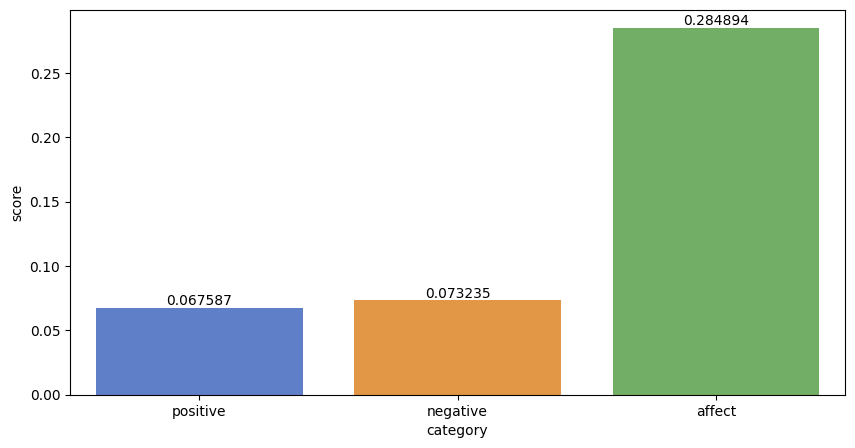

In [28]:
# a group of bar charts
plt.figure(figsize=(10, 5))
cols = ['#4D79DB', '#FC982C', '#6cba5a']
ax = sns.barplot(x='category', y='score', data=df_average, palette=cols)
# add value label
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%f' % float(p.get_height()), 
            fontsize=10, color='black', ha='center', va='bottom')
plt.show()

#### 小提琴图（不考虑缺失值）

In [34]:
'''
def get_NaN_ratio(community, category):
    #缺失值比例
    global com_3type
    com = com_3type[0]
    a = sum(com[category + '_score'].isnull())
    return a / com.shape[0]
'''

def get_NaN_ratio(df, category):
    '''计算缺失值比例'''
    a = sum(df[category + '_score'].isnull())
    return a / df.shape[0]


#### Positive

缺失值比例：
debunking: 0.10865762286695052


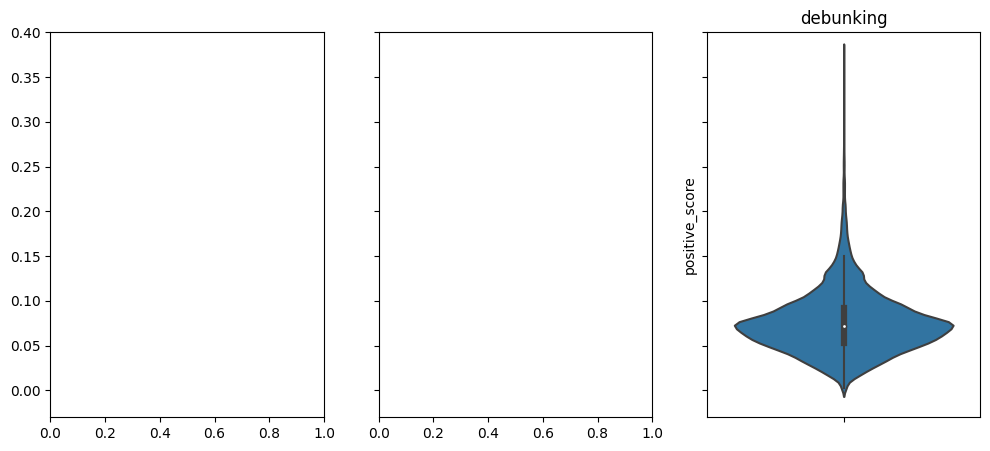

In [35]:
category = 'positive'
print("缺失值比例：")
print('debunking:', get_NaN_ratio(df, category))  # 使用您定义的函数来计算缺失值比例

# 创建绘图
fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)
sns.violinplot(y=df[category + '_score'], ax=axs[2])  # 使用sns绘制小提琴图
axs[2].set_title('debunking')  # 设置标题

plt.ylim(-0.03, 0.4)  # 设置y轴范围
plt.show()  # 显示图形


In [32]:
category = 'positive'
print("缺失值比例：")
print('debunking:', get_NaN_ratio('debunking', category))
fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

'''
sns.violinplot(y=com_3type['mainstream'][category + '_score'], ax=axs[0])
axs[0].set_title("mainsteam")

sns.violinplot(y=com_3type['fake_news'][category + '_score'], ax=axs[1])
axs[1].set_title('fake_news')
'''
sns.violinplot(y=com_3type[0][category + '_score'], ax=axs[2])
axs[2].set_title('debunking')

plt.ylim(-0.03, 0.4)
plt.show()

缺失值比例：


TypeError: string indices must be integers

缺失值比例：
debunking: 0.34706154558074964


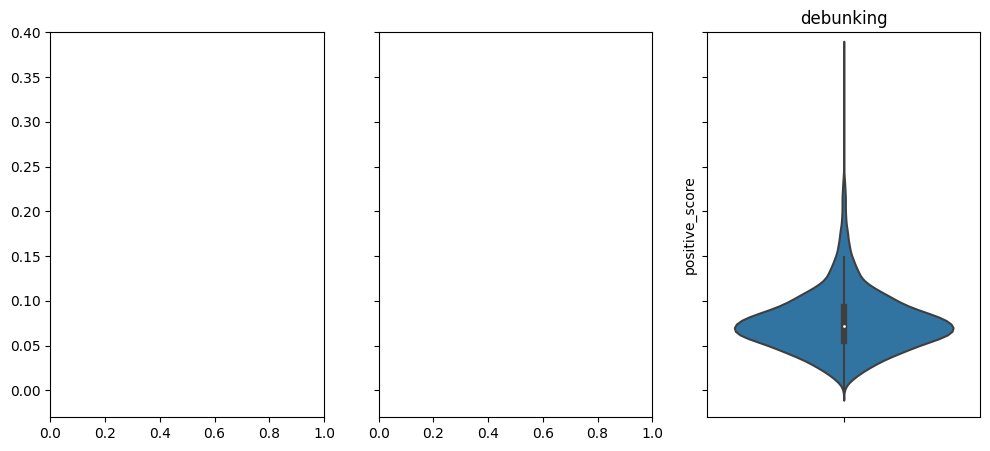

In [78]:
category = 'positive'
print("缺失值比例：")
#print('mainstream:', get_NaN_ratio('mainstream', category))
#print('fake_news:', get_NaN_ratio('fake_news', category))
print('debunking:', get_NaN_ratio('debunking', category))

fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

'''
sns.violinplot(y=com_3type['mainstream'][category + '_score'], ax=axs[0])
axs[0].set_title("mainsteam")

sns.violinplot(y=com_3type['fake_news'][category + '_score'], ax=axs[1])
axs[1].set_title('fake_news')
'''
sns.violinplot(y=com_3type['debunking'][category + '_score'], ax=axs[2])
axs[2].set_title('debunking')

plt.ylim(-0.03, 0.4)
plt.show()

##### Negative

缺失值比例：
debunking: 0.09895369178466515


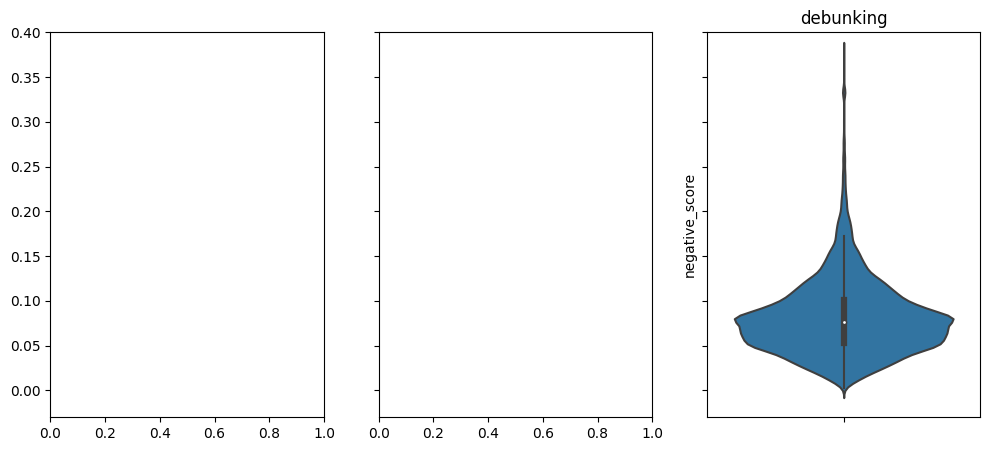

In [37]:
category = 'negative'
print("缺失值比例：")
print('debunking:', get_NaN_ratio(df, category))  # 使用您定义的函数来计算缺失值比例

# 创建绘图
fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)
sns.violinplot(y=df[category + '_score'], ax=axs[2])  # 使用sns绘制小提琴图
axs[2].set_title('debunking')  # 设置标题

plt.ylim(-0.03, 0.4)  # 设置y轴范围
plt.show()  # 显示图形


缺失值比例：
debunking: 0.33954187875983344


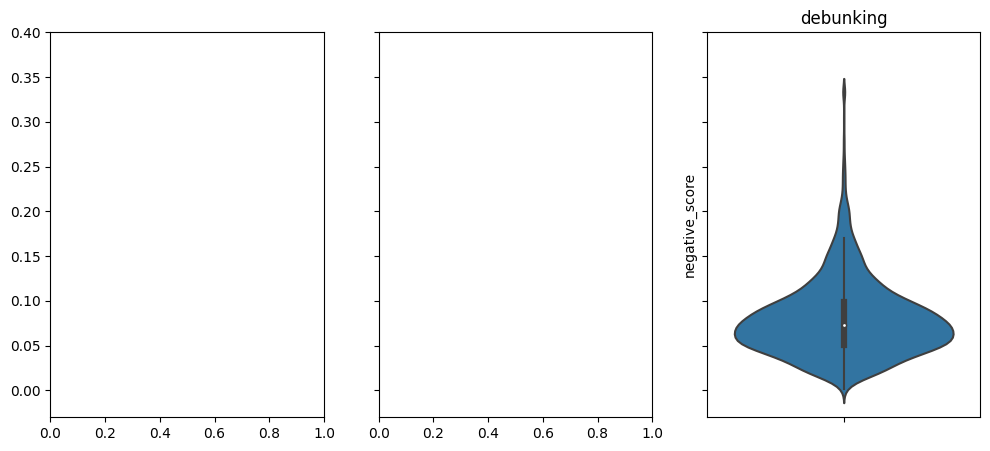

In [79]:
category = 'negative'
print("缺失值比例：")
#print('mainstream:', get_NaN_ratio('mainstream', category))
#print('fake_news:', get_NaN_ratio('fake_news', category))
print('debunking:', get_NaN_ratio('debunking', category))

fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)
'''
sns.violinplot(y=com_3type['mainstream'][category + '_score'], ax=axs[0])
axs[0].set_title("mainstream")

sns.violinplot(y=com_3type['fake_news'][category + '_score'], ax=axs[1])
axs[1].set_title('fake_news')
'''

sns.violinplot(y=com_3type['debunking'][category + '_score'], ax=axs[2])
axs[2].set_title('debunking')

plt.ylim(-0.03, 0.4)
plt.show()

##### Affect

缺失值比例：
debunking: 0.041027164405716736


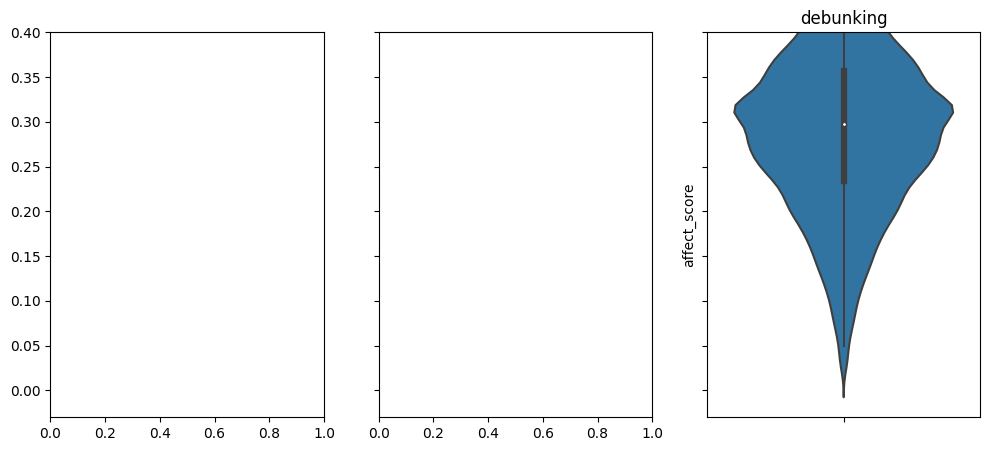

In [38]:
category = 'affect'
print("缺失值比例：")
print('debunking:', get_NaN_ratio(df, category))  # 使用您定义的函数来计算缺失值比例

# 创建绘图
fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)
sns.violinplot(y=df[category + '_score'], ax=axs[2])  # 使用sns绘制小提琴图
axs[2].set_title('debunking')  # 设置标题

plt.ylim(-0.03, 0.4)  # 设置y轴范围
plt.show()  # 显示图形


缺失值比例：
debunking: 0.29627487274409997


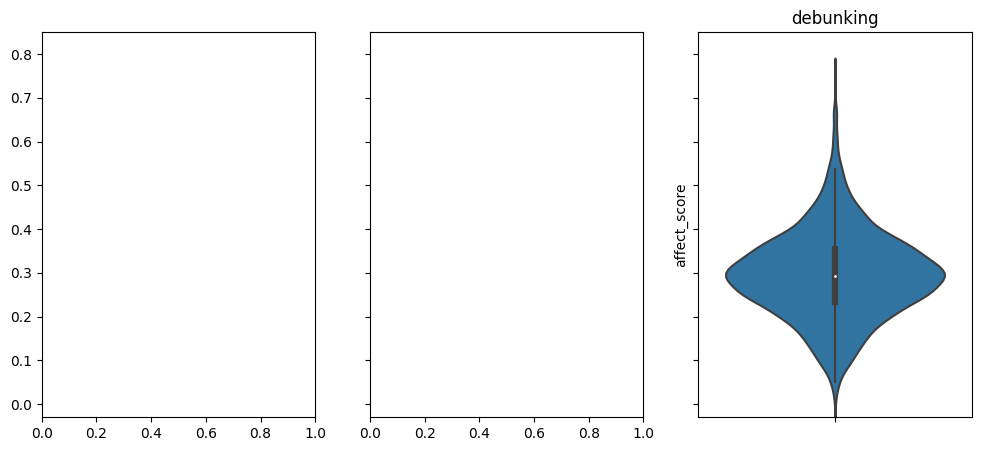

In [80]:
category = 'affect'
print("缺失值比例：")
#print('mainstream:', get_NaN_ratio('mainstream', category))
#print('fake_news:', get_NaN_ratio('fake_news', category))
print('debunking:', get_NaN_ratio('debunking', category))

fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

'''
sns.violinplot(y=com_3type['mainstream'][category + '_score'], ax=axs[0])
axs[0].set_title("mainstream")

sns.violinplot(y=com_3type['fake_news'][category + '_score'], ax=axs[1])
axs[1].set_title('fake_news')
'''

sns.violinplot(y=com_3type['debunking'][category + '_score'], ax=axs[2])
axs[2].set_title('debunking')

plt.ylim(-0.03, 0.85)
plt.show()

## 用Perspective API分析语言毒性

### 处理得到的的毒性分数

In [2]:
perspective_res = pd.read_csv("new_user_texts_with_perspective_api_results[[topic=RC16][lang=en].csv")
perspective_res.info()

def get_score_from_json(x):
    # x为待处理的json字符串
    if pd.isna(x):
        return None
    s = re.search("'score': {'value': (.+?),", x)
    return float(s.group(1))

perspective_res['toxicity_score'] = perspective_res['perspective_api_results'].apply(get_score_from_json)
perspective_res.to_csv("new_user_texts_with_perspective_api_results[topic=RC16][lang=en].csv", index=False)
perspective_res.sample(5).loc[:, ['toxicity_score']]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18385 entries, 0 to 18384
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   author                   18385 non-null  object
 1   body                     18278 non-null  object
 2   perspective_api_results  18251 non-null  object
dtypes: object(3)
memory usage: 431.0+ KB


,toxicity_score
6674,0.491397
17238,NaN
15736,0.115658
13941,0.246033
15656,0.231629


In [42]:
pwd

'/mnt/data/wenlu/reddit-new'

In [23]:
perspective_res.index = perspective_res['author']

def get_user_toxicity(u):
    global perspective_res
    try:
        tmp = perspective_res['toxicity_score'][u]
        if pd.isna(tmp):
            raise
        return tmp
    except:
        return None

df['toxicity_score'] = df['autho'].apply(get_user_toxicity)
    
'''
communities_topn = load("/mnt/data/wenlu/pkl2/communities_topn_[topic=RU2].pkl")
for c in communities_topn:
    c['toxicity_score'] = c['Id'].apply(get_user_toxicity)
dump(communities_topn, "/mnt/data/wenlu/pkl2/new_communities_topn[topic=RU].pkl")
'''

'\ncommunities_topn = load("/mnt/data/wenlu/pkl2/communities_topn_[topic=RU2].pkl")\nfor c in communities_topn:\n    c[\'toxicity_score\'] = c[\'Id\'].apply(get_user_toxicity)\ndump(communities_topn, "/mnt/data/wenlu/pkl2/new_communities_topn[topic=RU].pkl")\n'

In [25]:
dump(df,'16-pkl/16election-sentiment_toxicity[lang=en][time=16.10-16.12].pkl')

['16-pkl/16election-sentiment_toxicity[lang=en][time=16.10-16.12].pkl']

In [52]:
# 归类三种社区
# ms_list = [0]#, 3, 4, 5, 6, 7]    # 主流
# fn_list = [1]                   # 虚假信息
# db_list = [2]                   # 辟谣
com_3type = communitiy_classifying(communities_topn, ['mainstream','fake_news','debunking'], [ms_list, fn_list, db_list])

In [53]:
com_3type

{'mainstream':                     Id            Label  modularity_class  indegree  \
 0               ddale8           ddale8               241      4874   
 1       washingtonpost   washingtonpost               241      3195   
 2           petestrzok       petestrzok               241      3167   
 3              dpfunke          dpfunke               241      1779   
 4                MSNBC            MSNBC               241      1404   
 ...                ...              ...               ...       ...   
 41699  operabinoculars  operabinoculars               241         0   
 41700  JKleinschmidtIR  JKleinschmidtIR               241         0   
 41701     NSA_Slovakia     NSA_Slovakia               241         0   
 41702   montse__garcia   montse__garcia               241         0   
 41703      vurban_2022      vurban_2022               241         0   
 
        outdegree  degree  positive_score  negative_score  affect_score  \
 0              1    4875             NaN    

### 平均值(缺失值填0)

In [29]:
def average_toxicity(df: pd.DataFrame):
    '''缺失值填0'''
    user = list(df['author'])
    total = 0
    error = 0
    for u in user:
        try:
            tmp = perspective_res['toxicity_score'][u]
            if pd.isna(tmp):
                raise
            total += tmp
        except:
            error += 1
    average = total / df.shape[0]
    return average

toxicity = average_toxicity(df)
print(toxicity)


0.34876348342874897


In [40]:
def average_toxicity(community:pd.DataFrame):
    '''缺失值填0'''
    global perspective_res
    user = list(df['author'])
    total = 0
    error = 0
    for u in user:
        try:
            tmp = perspective_res['toxicity_score'][u]
            if pd.isna(tmp):
                raise
            total += tmp
        except:
            error += 1
    average = total / community.shape[0]
    return average

toxicity = pd.DataFrame([average_toxicity(c) for c in com_3type.values()], columns=['toxicity'])
toxicity['community'] = list(com_3type.keys())
toxicity

,toxicity,community
0,0.182451,mainstream
1,0.187668,fake_news
2,0.171200,debunking


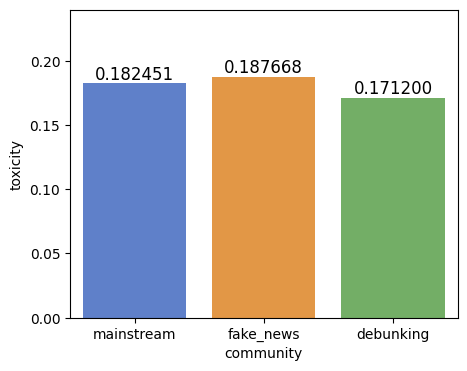

In [41]:
plt.figure(figsize=(5, 4))
cols = ['#4D79DB', '#FC982C', '#6cba5a']
ax = sns.barplot(x='community', y='toxicity', data=toxicity, palette=cols)
# 在每个条形上添加数值标签
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%f' % float(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')
plt.ylim(0, 0.24)
plt.show()

### 小提琴图

缺失值比例：
mainstream: 0.035823901784001536
fake_news: 0.020388890234157443
debunking: 0.017465475223395612


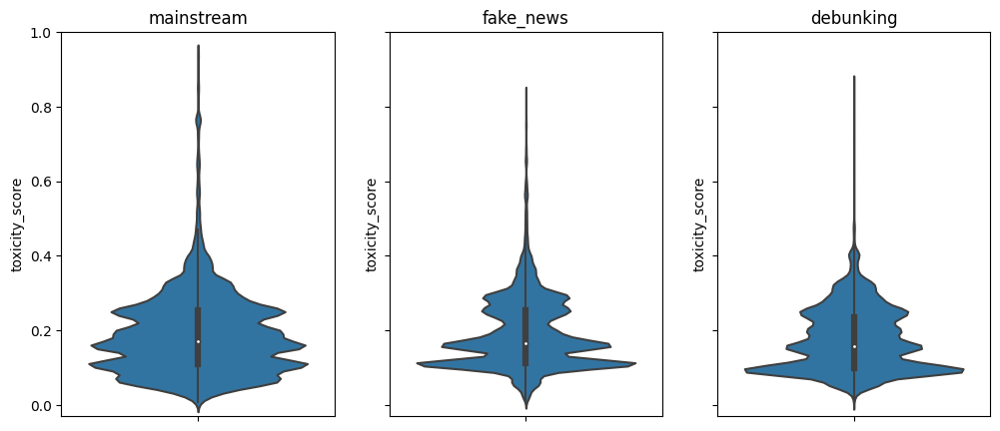

In [42]:
# 三张图画在一起
category = 'toxicity'
print("缺失值比例：")
print('mainstream:', get_NaN_ratio('mainstream', category))
print('fake_news:', get_NaN_ratio('fake_news', category))
print('debunking:', get_NaN_ratio('debunking', category))

fig, axs = plt.subplots(1, 3, figsize=(12, 5), sharey=True)

sns.violinplot(y=com_3type['mainstream']['toxicity_score'], ax=axs[0])
axs[0].set_title("mainstream")

sns.violinplot(y=com_3type['fake_news']['toxicity_score'], ax=axs[1])
axs[1].set_title('fake_news')

sns.violinplot(y=com_3type['debunking']['toxicity_score'], ax=axs[2])
axs[2].set_title('debunking')

plt.ylim(-0.03, 1.0)
plt.show()

## 毒性-情感分数联合分布

In [30]:
from matplotlib import cm

In [48]:
#！ 和原来代码不一样，这里有修改，没有做community classification，没有community信息
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# 假设你的DataFrame是df，且你想要在x，y上绘制热力图 
def toxicity_sentiment_heatmap_3d(df, category, title=""):  
    '''绘制交互式3D热力图。'''
    df = df[df[category+'_score'].notna() & df['toxicity_score'].notna()]   # 去除缺失值
    data = np.vstack([df[category+'_score'].values, df['toxicity_score'].values])

    # 计算数据的核密度估计
    kde = gaussian_kde(data)

    # 创建一个均匀的网格来评估kde
    xgrid = np.linspace(data[0].min(), data[0].max(), 100)
    ygrid = np.linspace(data[1].min(), data[1].max(), 100)
    Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
    Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))

    # 创建一个3D图形
    fig = go.Figure(data=[go.Surface(z=Z.reshape(Xgrid.shape), x=Xgrid, y=Ygrid, colorscale='Jet')])

    # 更新图形的布局
    fig.update_layout(title=category, autosize=False,
                    width=700, height=700,
                    scene=dict(
                        xaxis_title=category+'_score',
                        yaxis_title='toxicity_score',
                        zaxis_title='Kernel Density'
                    ),
                    margin=dict(l=65, r=50, b=65, t=90))

    # 显示图形
    fig.show()

In [43]:
import numpy as np
import plotly.graph_objects as go
from scipy.stats import gaussian_kde

# 假设你的DataFrame是df，且你想要在x，y上绘制热力图
def toxicity_sentiment_heatmap_3d(community, category):
    '''绘制交互式3D热力图。'''
    global com_3type
    
    df = com_3type[community].copy()
    df = df[df[category+'_score'].notna() & df['toxicity_score'].notna()]   # 去除缺失值
    data = np.vstack([df[category+'_score'].values, df['toxicity_score'].values])

    # 计算数据的核密度估计
    kde = gaussian_kde(data)

    # 创建一个均匀的网格来评估kde
    xgrid = np.linspace(data[0].min(), data[0].max(), 100)
    ygrid = np.linspace(data[1].min(), data[1].max(), 100)
    Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
    Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))

    # 创建一个3D图形
    fig = go.Figure(data=[go.Surface(z=Z.reshape(Xgrid.shape), x=Xgrid, y=Ygrid, colorscale='Jet')])

    # 更新图形的布局
    fig.update_layout(title=community, autosize=False,
                    width=700, height=700,
                    scene=dict(
                        xaxis_title=category+'_score',
                        yaxis_title='toxicity_score',
                        zaxis_title='Kernel Density'
                    ),
                    margin=dict(l=65, r=50, b=65, t=90))

    # 显示图形
    fig.show()

In [39]:
'''
def toxicity_sentiment_heatmap(df, category, xlim=(-0.01, 0.4), ylim=(-0.05, 0.7)):
    #global com_3type
    #df = com_3type[community]
    # 创建核密度估计图
    plt.figure()
    sns.kdeplot(data=df, x=category+'_score', y='toxicity_score', fill=True, levels=15)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.title(community)
    plt.show()
''' 

# ！同上，这里有修改
def toxicity_sentiment_heatmap(df, category, xlim=(-0.01, 0.4), ylim=(-0.05, 0.7), title=""):
    '''绘制核密度估计图。'''
    # 创建核密度估计图
    plt.figure()
    sns.kdeplot(data=df, x=category+'_score', y='toxicity_score', fill=True, levels=15)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.title(title)
    plt.show()


### （1）Toxicity-Positivity

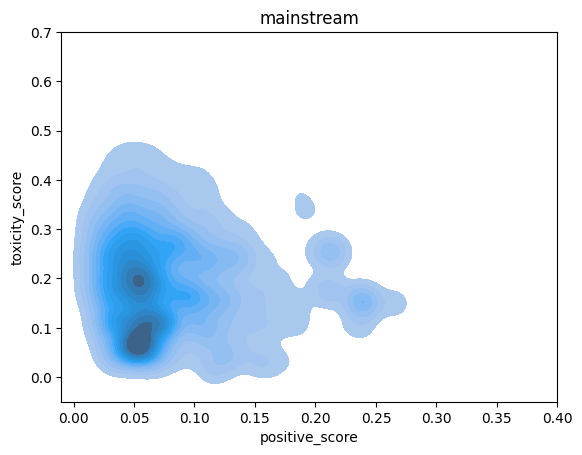

In [45]:
toxicity_sentiment_heatmap('mainstream', 'positive')

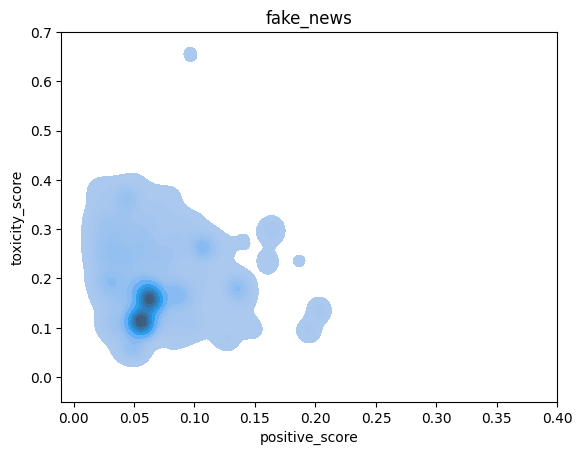

In [46]:
toxicity_sentiment_heatmap('fake_news', 'positive')

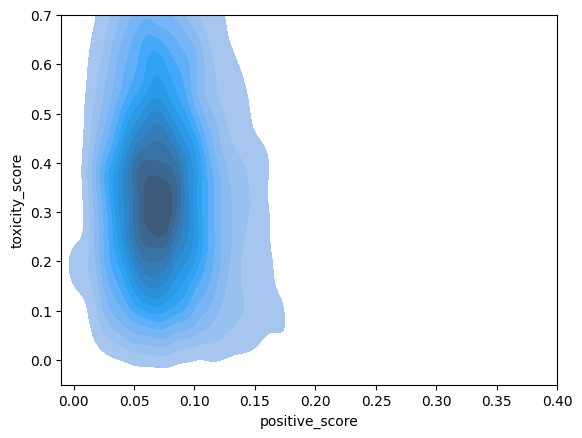

In [41]:
toxicity_sentiment_heatmap(df, 'positive')

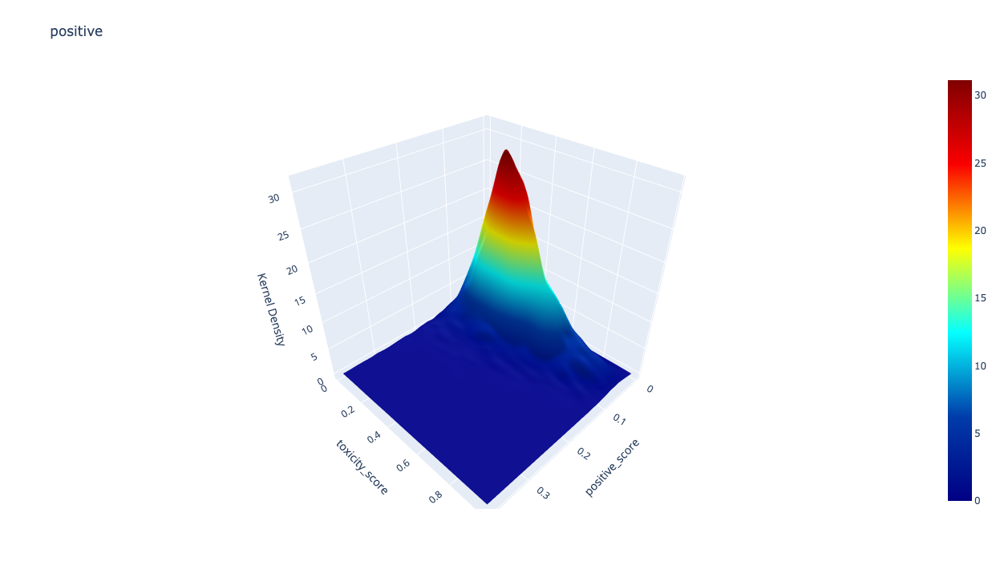

In [49]:
toxicity_sentiment_heatmap_3d(df,'positive')

### （2）Toxicity-Negativity

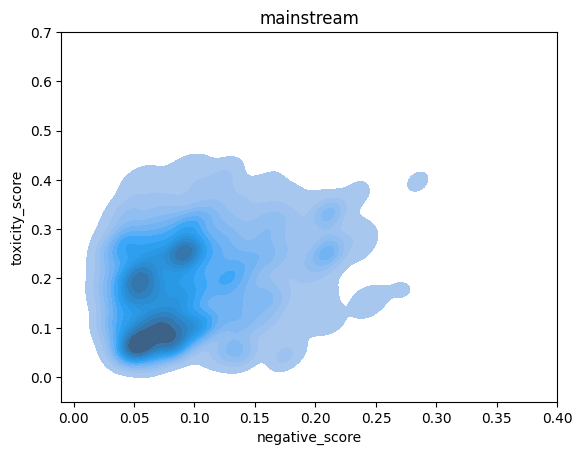

In [48]:
toxicity_sentiment_heatmap('mainstream', 'negative')

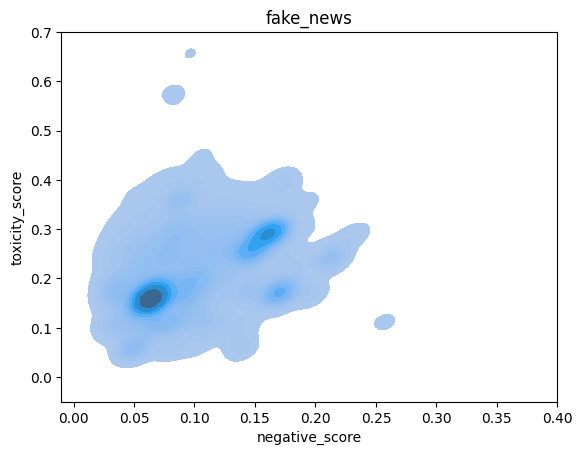

In [49]:
toxicity_sentiment_heatmap('fake_news', 'negative')

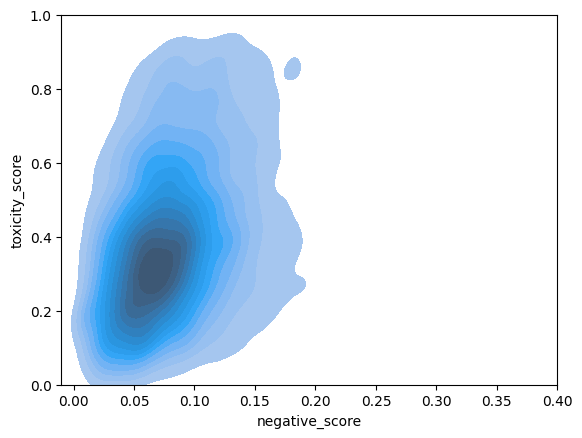

In [53]:
toxicity_sentiment_heatmap(df, 'negative',xlim=(-0.01, 0.4), ylim=(0.0,1))

In [2]:
toxicity_sentiment_heatmap_3d('mainstream','negative')

NameError: name 'toxicity_sentiment_heatmap_3d' is not defined

In [ ]:
toxicity_sentiment_heatmap_3d('fake_news','negative')

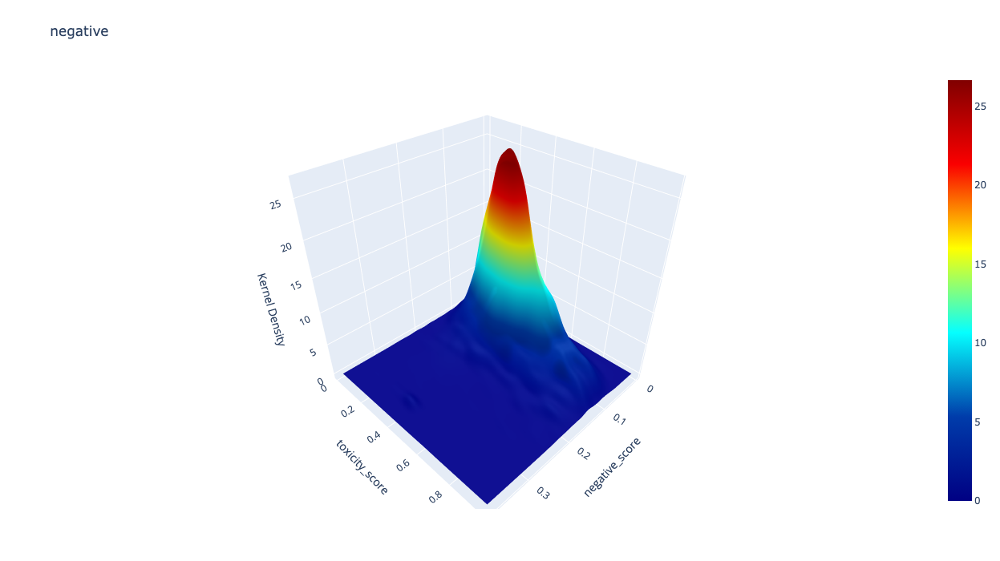

In [50]:
toxicity_sentiment_heatmap_3d(df,'negative',)

### （3）Toxicity-Affect

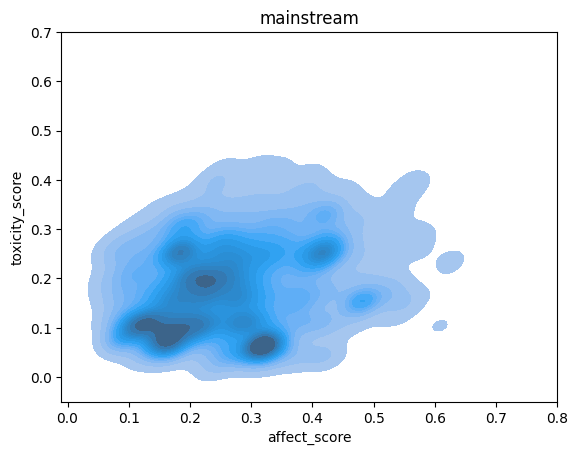

In [51]:
toxicity_sentiment_heatmap('mainstream', 'affect', xlim=(-0.01, 0.8))

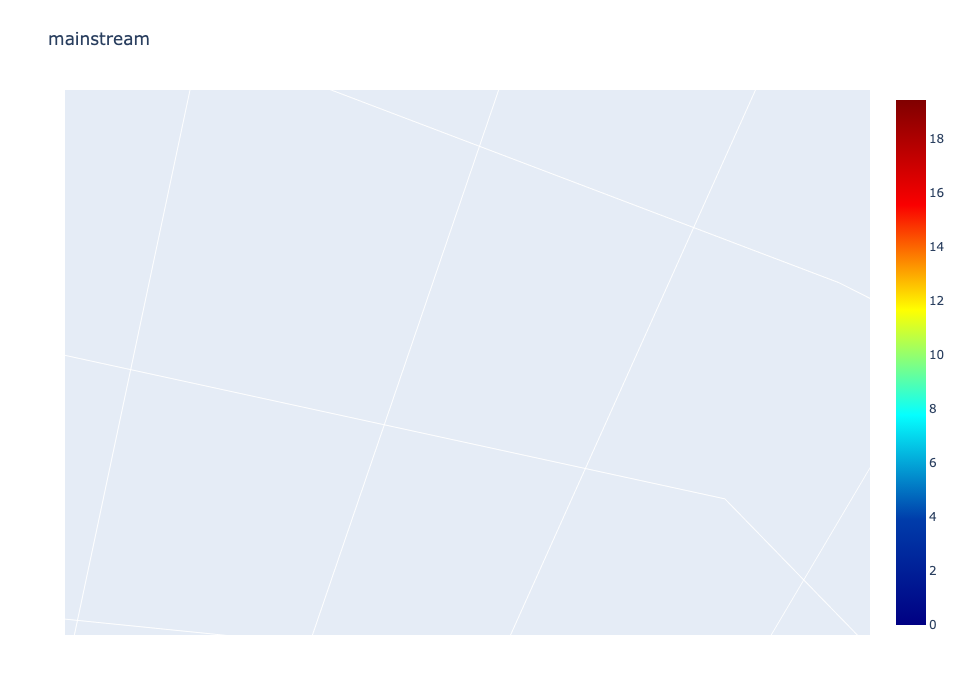

In [53]:
toxicity_sentiment_heatmap_3d('mainstream', 'affect')

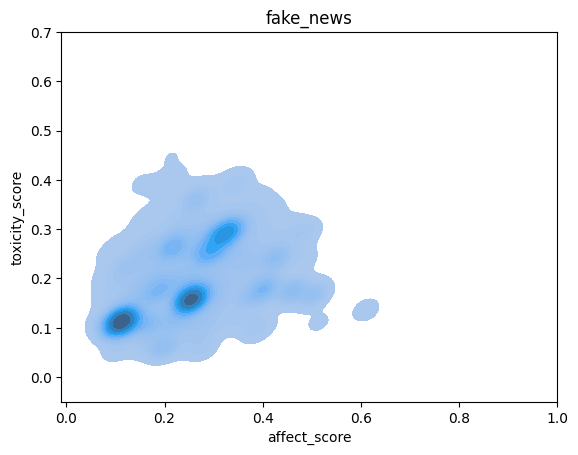

In [52]:
toxicity_sentiment_heatmap('fake_news', 'affect', xlim=(-0.01, 1))

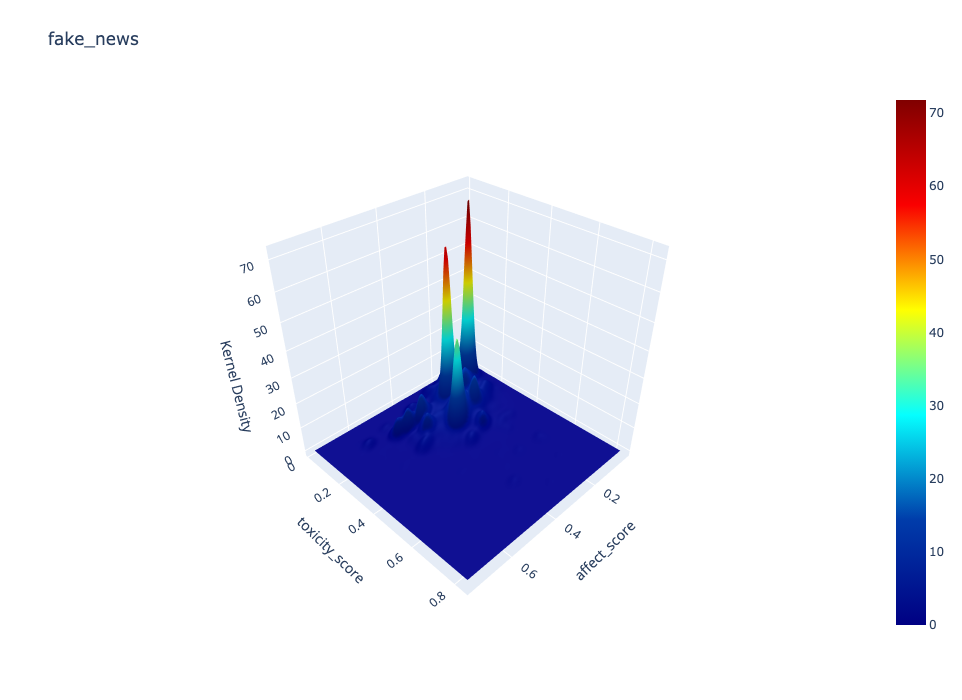

In [54]:
toxicity_sentiment_heatmap_3d('fake_news', 'affect')

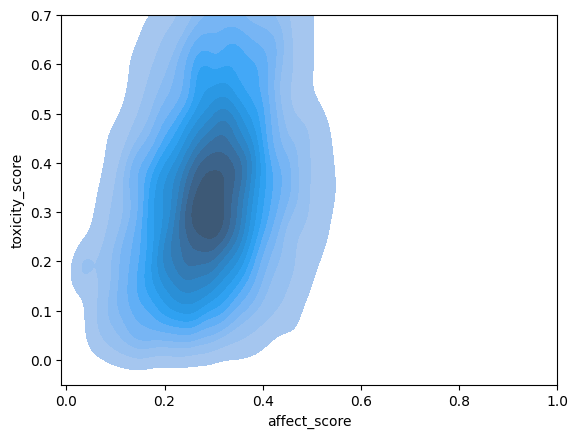

In [43]:
toxicity_sentiment_heatmap(df, 'affect', xlim=(-0.01, 1))

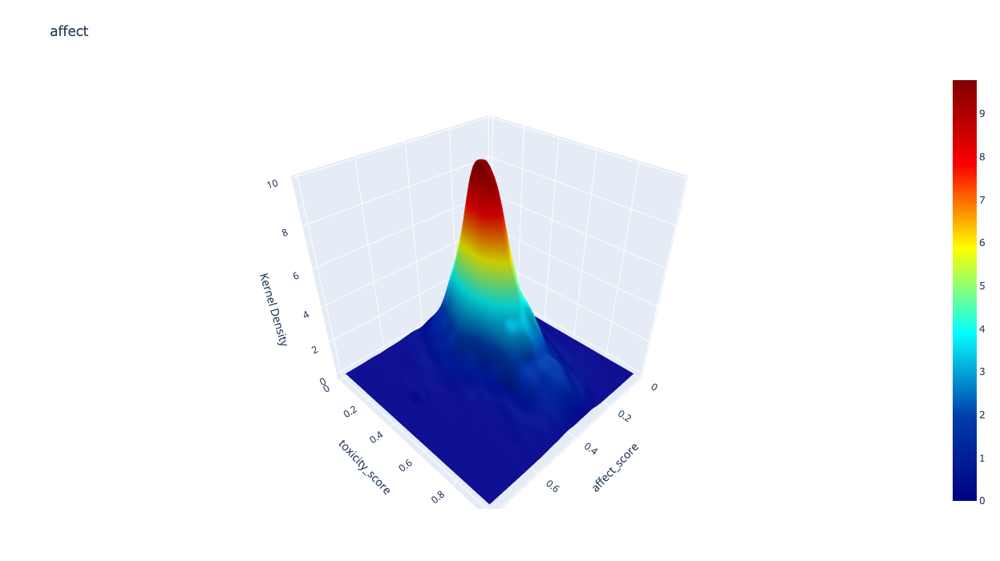

In [51]:
toxicity_sentiment_heatmap_3d(df, 'affect')

## t-检验

In [59]:
# t-检验
def t_test(df1, df2, column):
    if df1[column].agg(np.std) != df2[column].agg(np.std): 
        
        df1_column = sm.stats.DescrStatsW(df1[column])
        df2_column = sm.stats.DescrStatsW(df2[column])
        
        mean = df2_column.mean - df1_column.mean
        pvalue = list(sm.stats.CompareMeans(df2_column, df1_column).ttest_ind(usevar='unequal'))[1]
        return mean, pvalue
    
    else:
        print("Pooled")

def t_test_all_category(com1:str, com2:str, categories:list):
    '''注：缺失值填0'''
    global com_3type
    results = {}
    df1 = com_3type[com1].fillna(0.0)
    df2 = com_3type[com2].fillna(0.0)
    for category in categories:
        results[category] = t_test(df1, df2, category + "_score")
    return results

In [60]:
t_test_all_category('mainstream', 'fake_news', ['affect','positive','negative','toxicity'])

{'affect': (-0.019334319532703176, 6.378147002240898e-132),
 'positive': (0.004053272034800791, 1.7117567990073732e-52),
 'negative': (-0.011728630520056328, 2.667390914556156e-275),
 'toxicity': (0.010708385339047555, 1.5269728432764078e-85)}

In [61]:
t_test_all_category('mainstream', 'debunking', ['affect','positive','negative','toxicity'])

{'affect': (0.047447888341578565, 4.107674934085254e-233),
 'positive': (-0.001401145661547476, 0.002304651742403694),
 'negative': (0.02383306102859921, 2.0108438629912702e-256),
 'toxicity': (0.065774576035662, 0.0)}

In [62]:
t_test_all_category('fake_news', 'debunking', ['affect','positive','negative','toxicity'])

{'affect': (0.06678220787428174, 0.0),
 'positive': (-0.005454417696348267, 9.62621760457291e-32),
 'negative': (0.03556169154865554, 0.0),
 'toxicity': (0.05506619069661445, 0.0)}